In [1]:
import math
from typing import Any

import torch

from torch import Tensor
from torch.nn.parameter import Parameter, UninitializedParameter
from torch import functional as F

from torch.nn import Module
from scipy.stats import pareto 
from torch.distributions.pareto import Pareto
from torch.nn import init
from torch.distributions.cauchy import Cauchy
from torch.distributions.laplace import Laplace
seed=0
#torch.cuda.manual_seed_all(seed)
with torch.cuda.device('cuda:0'):
    torch.cuda.empty_cache()
import gc

gc.collect()

12

In [2]:
def stats(tensor):
    # Calculate the mean
    mean = torch.mean(tensor)
    # Calculate the variance
    second = torch.mean(torch.pow(tensor,2))
    third = torch.mean(torch.pow(tensor,3))
    fourth=torch.mean(torch.pow(tensor,4))
    # Calculate the standard deviation
    var=torch.var(tensor)
    std = torch.sqrt(var)
    # Calculate the z-scores
    zscores = (tensor - mean) / std
    # Calculate the skewness
    skew = torch.mean(zscores ** 3)
    # Calculate the kurtosis
    kurt = torch.mean(zscores ** 4) - 3
    print("fourth moment")
    print(fourth)
    #Return the results as a tuple
    return mean, second, skew, kurt

In [3]:
weight_tuning=1
## initial =1
class Linear(Module):
    r"""Applies a linear transformation to the incoming data: :math:`y = xA^T + b`

    This module supports :ref:`TensorFloat32<tf32_on_ampere>`.

    On certain ROCm devices, when using float16 inputs this module will use :ref:`different precision<fp16_on_mi200>` for backward.

    Args:
        in_features: size of each input sample
        out_features: size of each output sample
        bias: If set to ``False``, the layer will not learn an additive bias.
            Default: ``True``

    Shape:
        - Input: :math:`(*, H_{in})` where :math:`*` means any number of
          dimensions including none and :math:`H_{in} = \text{in\_features}`.
        - Output: :math:`(*, H_{out})` where all but the last dimension
          are the same shape as the input and :math:`H_{out} = \text{out\_features}`.

    Attributes:
        weight: the learnable weights of the module of shape
            :math:`(\text{out\_features}, \text{in\_features})`. The values are
            initialized from :math:`\mathcal{U}(-\sqrt{k}, \sqrt{k})`, where
            :math:`k = \frac{1}{\text{in\_features}}`
        bias:   the learnable bias of the module of shape :math:`(\text{out\_features})`.
                If :attr:`bias` is ``True``, the values are initialized from
                :math:`\mathcal{U}(-\sqrt{k}, \sqrt{k})` where
                :math:`k = \frac{1}{\text{in\_features}}`

    Examples::

        >>> m = nn.Linear(20, 30)
        >>> input = torch.randn(128, 20)
        >>> output = m(input)
        >>> print(output.size())
        torch.Size([128, 30])
    """
    __constants__ = ['in_features', 'out_features']
    in_features: int
    out_features: int
    weight: Tensor

    def __init__(self, in_features: int, out_features: int, bias: bool = True,
                 device=None, dtype=None) -> None:
        factory_kwargs = {'device': device, 'dtype': dtype}
        super().__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = Parameter(torch.empty((out_features, in_features), **factory_kwargs))
        if bias:
            self.bias = Parameter(torch.empty(out_features, **factory_kwargs))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self) -> None:
        #if reset=True:
            
        # Setting a=sqrt(5) in kaiming_uniform is the same as initializing with
        # uniform(-1/sqrt(in_features), 1/sqrt(in_features)). For details, see
        # https://github.com/pytorch/pytorch/issues/57109
        fan_in, _ = init._calculate_fan_in_and_fan_out(self.weight)
        bound =weight_tuning/ math.sqrt(fan_in) if fan_in > 0 else 0
        #init.uniform_(self.weight, -bound,bound)
        m = Cauchy(torch.tensor([0.0]), torch.tensor([bound]))
       
        
        
        a=m.sample(torch.Size([self.in_features*self.out_features]))[:,0]
        a=a.resize(self.out_features,self.in_features)
        self.weight=torch.nn.Parameter(a)
        #init.kaiming_uniform_(self.weight, a=math.sqrt(5))
        if self.bias is not None:
            fan_in, _ = init._calculate_fan_in_and_fan_out(self.bias)
            bound =weight_tuning/ math.sqrt(fan_in) if fan_in > 0 else 0
            init.uniform_(self.bias, -bound, bound)
            #init.uniform_(self.weight, -bound,bound)

    def forward(self, input: Tensor) -> Tensor:
        return F.linear(input, self.weight, self.bias)

    def extra_repr(self) -> str:
        return 'in_features={}, out_features={}, bias={}'.format(
            self.in_features, self.out_features, self.bias is not None
        )


In [4]:
import torch
import torchvision
#torch.cuda.is_available()
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import confusion_matrix
#from torch.autograd.functional import jacobian
#import torch.autograd.functional
import time
import copy
import matplotlib.pyplot as plt
import pandas as pd
torch.set_default_dtype(torch.float64)
batch_size=100
input_size=784
output_size=784
hidden_state_size=10
N=28
no_of_layer=2



font = {
        'size'   : 26}
plt.rc('font', **font)

class AE(nn.Module):
    def __init__(self, input_shape,hidden_layer_shape,encoder_output_shape,n,xinit=torch.eye(batch_size,input_size),xfinal=torch.eye(batch_size,input_size),hidden=torch.eye(10,input_size)):
        super().__init__()

        self.encoder_output_layer = Linear(
            in_features=input_shape, out_features=encoder_output_shape
        ,bias=False)
        self.decoder_output_layer = Linear(
            in_features=encoder_output_shape, out_features=input_shape
        ,bias=False)

        #self.encoder_input_layer.weight=torch.nn.Parameter(torch.rand(self.encoder_input_layer.weight.size))
        
        self.number_of_layers=n
        self.xinit=xinit
        self.xfinal=xfinal
        self.hidden=hidden

    def forward(self, features):
        reconstructed=self.internals(features)
        return reconstructed
    
    def internals(self,features):
        code=self.encoder(features)
        self.hidden=code
        #print("hidden state:"+str(code))
        reconstructed=self.decoder(code)
        return reconstructed
    
    def encoder(self,features):


        code = self.encoder_output_layer(features)
        result = torch.tanh(code)
        return code
    
    def decoder(self,code):  
        activation = self.decoder_output_layer(code)
        reconstructed = torch.tanh(activation)
        return reconstructed
    
    def xfinals(self):
        return self.xfinal
    
    def xinits(self):
        return self.xinit
    
    def hiddens(self):
        return self.hidden

In [5]:

#transform=
train_set = torchvision.datasets.FashionMNIST("./data", download=True, transform=
                                                transforms.Compose([
    transforms.ToTensor()
]))
test_set = torchvision.datasets.FashionMNIST("./data", download=True, train=False, transform=
                                               transforms.Compose([
    transforms.ToTensor()
]))  
train_loader = torch.utils.data.DataLoader(train_set, 
                                           batch_size=batch_size,shuffle=False)
test_loader = torch.utils.data.DataLoader(test_set,
                                          batch_size=batch_size,shuffle=False)

In [6]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
# create a model from `AE` autoencoder class
# load it to the specified device, either gpu or cpu
model = AE(input_size,output_size,hidden_state_size,no_of_layer).to(device)

# create an optimizer object
# Adam optimizer with learning rate 1e-3

optimizer =torch.optim.Adam(model.parameters(), lr=1e-3)

# mean-squared error loss
criterion = nn.MSELoss()

#print(model.encoder_input_layer.weight)

cuda


/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


In [7]:
import matplotlib.pyplot as plt 
epochs=1000
asymptotic_repetition=150


#projected_jacobian=[]
ave_len=5


no_of_images,no_of_repetition=20,50
spectral_calculation=5
colour=np.arange(1,no_of_repetition+1)
perturbation_strength=10**(-6)
noise_strength=10**(-3)
interval=50

In [8]:
def add_gaussian_noise(inputs,strength):
    #print(inputs.size())
    noise = torch.randn_like(inputs)*strength*torch.max(inputs)
    result=inputs + noise
    return result
def add_powerlaw_noise(input_size,batch_size,strength,images):
    ##input size here is the side of the image 28 
    m = Pareto(torch.tensor([1.0]), torch.tensor([1.0]))
    res=m.sample(images.size())

    temp=res/np.sqrt(res.var())/N/batch_size*strength
    noise=temp-temp.mean()
    #if print_bool:
     #   plt.title(powerlaw_noise print)
      #  plt.hist(noise.flatten(),density=True, bins='auto', histtype='stepfilled')
        
      #  plt.show()
    #print(noise[:,:,:,:,0].size())
    return noise[:,:,0]+images

def validation(test_loader):
    
    with torch.no_grad():

     #valid_loss = criterion(outputs, batch_features.view(batch_size,-1).to(device))
        loss=0
        for batch_features, _ in test_loader:
            #input=add_noise(batch_features,).view(100, -1).to(device)
            input_image=add_gaussian_noise(batch_features,noise_strength).view(batch_size, -1).to(device)
            #batch_feature = batch_features.view(batch_size, -1)
            #input_image =add_powerlaw_noise(input_size,batch_size,noise_strength,batch_feature).view(batch_size, -1).to(device)
            batch_feature = batch_features.view(batch_size, -1).to(device)
            outputs = model(input_image)
            valid_loss = criterion(outputs, input_image.to(device)) 
            #accuracy+=kl_div(outputs,batch_features)/batch_size
            loss += valid_loss.item()
    return loss/len(test_loader)
            
def kl_div(output_image,input_image):
    accuracy=0
    kl_loss = nn.KLDivLoss(reduction="batchmean")
    for i in range(len(input_image)):
        input_spectrum=torch.histogram(input_image[i].cpu(), bins=256, density=True)
        output_spectrum=torch.histogram(output_image[i].cpu(), bins=256, density=True)
        accuracy+=kl_loss(input_spectrum[i],output_spectrum[i])
    return accuracy/len(input_image)

def iteration(model,initial_inputs,no_of_repetition,epoch):
    y_pred=initial_inputs.to(device)
    for i in range(no_of_repetition):
        x_train=y_pred
        #if i==0:
           # name="progress asymptotic iteration:"+str(i)+" "
           # visualisation(x_train[0].cpu().detach(),epoch,name,False)
        #if i%5==1:
            #name="progress asymptotic iteration:"+str(i)+" "
            #visualisation(x_train[0].cpu().detach(),epoch,name,False)
        y_pred=model(x_train)
    return x_train,y_pred,model 
def asymptotic_jacobian(model,initial_input,no_of_images,no_of_repetition):
    ave_jac=1
    overall_distribution=np.asarray([])
    y_pred=initial_input.to(device)
    jacobian=[]
    sorteds=np.asarray([])
    for j in range(no_of_repetition):
        #print("here")
        x_train=y_pred
        
        y_pred=model(x_train)
        mean_jacobian=torch.eye(input_size,output_size).to(device)
        
        for i in range(no_of_images):
            x=x_train[i]
            res=torch.autograd.functional.jacobian(model,x)
            distribution=np.asarray([])
            jacobian.append(res)
            sorted=np.asarray([])
            #if j==no_of_repetition-1
            mean_jacobian*=res
             #   distribution,sorted=spectral_distribution(res.cpu())
              #  overall_distribution=np.concatenate((overall_distribution,distribution),axis=0)
              #  spectral=spectral_radius(sorted)
              #  sorteds=np.append(sorteds,spectral)

        norm=torch.norm(mean_jacobian).cpu()
        #mean_jacobian*=(1/np.sqrt(output_size)*norm)**(1/no_of_images)
        #mean_jacobian=mean_jacobian/no_of_images
        ave_jac*=(1/np.sqrt(output_size)*norm)**(1/no_of_repetition*1/no_of_images)
        print(ave_jac)
        print(norm)
        print(norm**(1/no_of_repetition*1/no_of_images))
    #average_jacobian=ave_jac/no_of_repetition
    print(jacobian)
    return ave_jac,overall_distribution,jacobian,sorteds

def spectral_radius(jacobian,no_of_repetition,no_of_images):
    #result=[]
   
    #output=initial_input.to(device)
   # product=torch.eye(n=input_size,m=output_size).to(device)
    
    spectral=0

    
        
    #res=torch.autograd.functional.jacobian(model.internals,initial_input)
    #product=torch.matmul(product,res)
    #output=model(initial_input)
   # initial_input=output
    
    s,v=torch.linalg.eig(jacobian)
 #   #print(s)
    abs=torch.abs(s)
    
    spectral=torch.max(abs).item()
    return spectral

def poincare_plot(model,initial_input,dimension_vector,no_of_repetition,colour,epoch):
    xt=[]
    xtminus=[]
    
    output=initial_input
    
    for i in range(no_of_repetition):
        
        initial_input=output
        output=model(initial_input)
        
        xt.append(1/output_size*torch.dot(output,dimension_vector).item())
        xtminus.append(1/output_size*torch.dot(initial_input,dimension_vector).item())
    
    return xt,xtminus
  
    


def asymptotic_distance(xinfinity_unperturbed,xinfinity_perturbed,perturbation):
    result=[]
    for i in range(len(xinfinity_unperturbed)):
    
        sum=0
        
        for j in range(len(xinfinity_unperturbed[i])):
            
            temp=np.linalg.norm(xinfinity_unperturbed[i][j]-xinfinity_perturbed[i][j])
            sum+=temp
        
        result.append(1/output_size*1/len(xinfinity_unperturbed[i])*sum) 
    
    return result


def calculation(model,no_of_images,no_of_repetition,ave_jacobian,spectral_radiuses,image,epoch):
    spectral=0
    
    model_clone=AE(input_size,input_size,hidden_state_size,no_of_layer).to(device)
    model_clone.load_state_dict(copy.deepcopy(model.state_dict()))
    distributions=np.asarray([])
    x_train,y_pred,model_clone=iteration(model_clone,image,asymptotic_repetition,epoch)   
    #ave_jac,distributions,jacobian,sorteds= asymptotic_jacobian(model_clone,x_train,no_of_images,no_of_repetition)
    
    #np.savetxt("jacobian epoch"+str(epoch)+".txt",sorteds)
    #print("distribution size")
    #print(distributions.size)
    #print("sorted size")
    #print(sorteds.size)
    #average_jacobian.append(ave_jac)
    #x = [ele.real for ele in distributions]
    ## extract imaginary part
    #y = [ele.imag for ele in distributions]
    #plt.title("real and imaginary part of eigenvalue")
    #plt.scatter(x, y)
    #plt.ylabel('Imaginary')
    #plt.xlabel('Real')
    #plt.xscale("log")
    #plt.yscale("log")
    #plt.xlim(-1,1)
    #plt.ylim(-1,1)
    #plt.savefig("epoch:"+str(epoch+1)+"number of iteration:"+str(no_of_repetition)+"eigenvalue scatter plot.jpg",bbox_inches = 'tight')
    #plt.show()
    #plt.title("modulus of eigenvalue in log log plot ")
    #plt.hist(sorteds, density=True, bins='auto', histtype='stepfilled')
    #plt.yscale("log")
    #plt.xscale("log")

    #plt.savefig("epoch:"+str(epoch+1)+"number of iteration:"+str(no_of_repetition)+"eigenvalue distribution.jpg",bbox_inches = 'tight')
    #plt.show()

   # for i in range(no_of_images):
    
        #spectral+=spectral_radius(sorteds,no_of_repetition,no_of_images)
    #spectral=sorteds.mean()
    
    #spectral_radiuses.append(spectral)
    #print(spectral/no_of_images)
    
    return x_train,y_pred,average_jacobian,spectral_radiuses,model_clone


def asymptotic_iteration(model_new,initial_inputs,perturbed_inputs,no_of_repetition,no_of_image,cutoff):
    
    y_pred_unperturbed=initial_inputs.to(device)
    y_pred_perturbed=perturbed_inputs.to(device)
    #cutoff=[]
   
    #for j in range(no_of_image):
     
    #cutoff.append(torch.norm(y_pred_unperturbed[j]-y_pred_perturbed[j]))
        #print(cutoff[j])
    distance=[]
    hidden_layer=[]
    hiddens=[]
    chaos=0
    ave_jac,distributions,jacobian,sorteds= asymptotic_jacobian(model_new,y_pred_unperturbed,no_of_images,no_of_repetition)
    for i in range(no_of_repetition):
        x_train_unperturbed=y_pred_unperturbed
        y_pred_unperturbed=model_new(x_train_unperturbed)
        
       
        x_train_perturbed=y_pred_perturbed
        y_pred_perturbed=model_new(x_train_perturbed)
        
       # print(y_pred_perturbed,y_pred_unperturbed)
        
        hidden = model.hiddens()
        #print(hidden)
        #print(torch.sum(hidden,dim=1).cpu().detach().numpy()/1000)
        hidden_layer.append(torch.sum(hidden,dim=1)[0].cpu().detach().numpy()/10)
        hiddens.append(torch.sum(hidden,dim=1).cpu().detach().numpy()/10)
        
        #visualisation(y_pred.view(batch_size,-1)[0].cpu().detach(),epoch)


        #diff=0
        diff=torch.ones(1,device=device)
        temp=0
        #print(len(cutoff))
        for j in range(no_of_image):
            result=torch.norm(y_pred_unperturbed[j]-y_pred_perturbed[j])
            #print(np.isnan(result.cpu().detach().numpy()))
            #print(result)
            if np.isinf(result.cpu().detach().numpy()) or np.isnan(result.cpu().detach().numpy())  :
                result=torch.Tensor([1*10**38]).to(device)
                print("infinity")
            if result.cpu().detach().numpy()<2**-52:
                result=torch.Tensor([2**-52]).to(device)
            #temp=result
            diff*=result**(1/no_of_image)
            
            #print(j)
            if result>cutoff[j] and i==no_of_repetition-1:
                chaos+=1
        if np.isinf(diff.cpu().detach().numpy()) or np.isnan(diff.cpu().detach().numpy()):
            diff=torch.Tensor([1*10**38]).to(device)
            print("infinity")
            #print("asymptotic calculation")
            #print(result.cpu())
            #print(diff.cpu())
            
        if diff.cpu().detach().numpy()<2**-52:
            diff=torch.Tensor([2**-52]).to(device)
        distance.append(diff.cpu().detach().numpy())

    return distance,hidden_layer,chaos/no_of_image,ave_jac

def visualisation(xfinals,epoch,name,bool):
    plt.imshow(xfinals.reshape(N,N), cmap="gray")
    if bool:
        plt.savefig(str(name)+" epoch:"+str(epoch+1)+".jpg")
    plt.show()
    print(str(name)+" epoch:"+str(epoch+1)+".jpg")
    
def divergence(values):
    result=np.abs(values[-1]-values[-2])
    if result>np.abs(values[2]-values[1]):
        return 1
    return 0

def spectral_radius(sorted):
    if len(sorted)==0:
        return 0
    return sorted[0]

def spectral_distribution(input_matrix):
    result=[]
    count=0
    s,v=torch.linalg.eig(input_matrix)
    #return s
    for i in range(len(s)):
        if np.abs(s[i].cpu())<2**-52:
            count+=1
        
    sorted, indices=torch.sort(torch.abs(s),dim=-1,descending=True)
    #for index in indices.cpu():
     #   if index<=len(s)-count:
     #       result.append(s[index])
    #print(sorted)
    return s,sorted[:-count]



running
tensor(0.7485)
tensor(4.4670e-125)
tensor(0.7510)
tensor(0.5806)
tensor(1.2852e-109)
tensor(0.7782)
tensor(0.4333)
tensor(2.6362e-126)
tensor(0.7489)
tensor(0.3339)
tensor(1.7907e-112)
tensor(0.7731)
tensor(0.2499)
tensor(4.4670e-125)
tensor(0.7510)
tensor(0.1939)
tensor(1.2852e-109)
tensor(0.7782)
tensor(0.1447)
tensor(2.6362e-126)
tensor(0.7489)
tensor(0.1115)
tensor(1.7907e-112)
tensor(0.7731)
tensor(0.0835)
tensor(4.4670e-125)
tensor(0.7510)
tensor(0.0647)
tensor(1.2852e-109)
tensor(0.7782)
tensor(0.0483)
tensor(2.6362e-126)
tensor(0.7489)
tensor(0.0372)
tensor(1.7907e-112)
tensor(0.7731)
tensor(0.0279)
tensor(4.4670e-125)
tensor(0.7510)
tensor(0.0216)
tensor(1.2852e-109)
tensor(0.7782)
tensor(0.0161)
tensor(2.6362e-126)
tensor(0.7489)
tensor(0.0124)
tensor(1.7907e-112)
tensor(0.7731)
tensor(0.0014)
tensor(1.7907e-112)
tensor(0.7731)
tensor(0.0010)
tensor(4.4670e-125)
tensor(0.7510)
tensor(0.0008)
tensor(1.2852e-109)
tensor(0.7782)
tensor(0.0006)
tensor(2.6362e-126)
tensor(

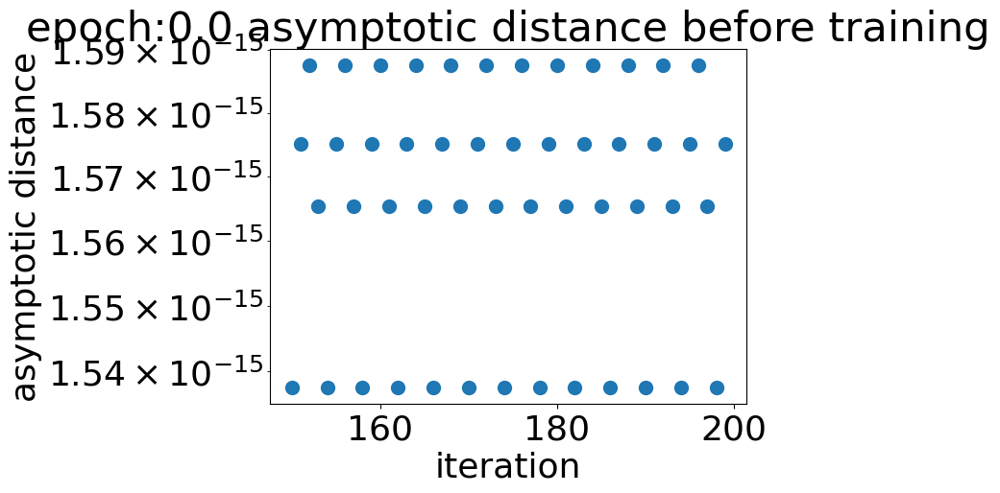

epoch : 1/1000, training loss = 0.997959,validation loss = 0.883571
epoch : 2/1000, training loss = 0.834806,validation loss = 0.793824
epoch : 3/1000, training loss = 0.768473,validation loss = 0.746092
epoch : 4/1000, training loss = 0.725073,validation loss = 0.705157
epoch : 5/1000, training loss = 0.690921,validation loss = 0.668882
epoch : 6/1000, training loss = 0.655599,validation loss = 0.642160
epoch : 7/1000, training loss = 0.632555,validation loss = 0.621843
epoch : 8/1000, training loss = 0.613512,validation loss = 0.605038
epoch : 9/1000, training loss = 0.599326,validation loss = 0.591312
epoch : 10/1000, training loss = 0.586119,validation loss = 0.578900
epoch : 11/1000, training loss = 0.573090,validation loss = 0.565967
epoch : 12/1000, training loss = 0.560702,validation loss = 0.554703
epoch : 13/1000, training loss = 0.550746,validation loss = 0.545715
epoch : 14/1000, training loss = 0.541691,validation loss = 0.536165
epoch : 15/1000, training loss = 0.531995,v

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9959)
tensor(0.4618)
tensor(0.9992)
tensor(0.9918)
tensor(0.4365)
tensor(0.9992)
tensor(0.9874)
tensor(0.3443)
tensor(0.9989)
tensor(0.9828)
tensor(0.2628)
tensor(0.9987)
tensor(0.9780)
tensor(0.2033)
tensor(0.9984)
tensor(0.9730)
tensor(0.1719)
tensor(0.9982)
tensor(0.9680)
tensor(0.1583)
tensor(0.9982)
tensor(0.9630)
tensor(0.1619)
tensor(0.9982)
tensor(0.9582)
tensor(0.1788)
tensor(0.9983)
tensor(0.9534)
tensor(0.1859)
tensor(0.9983)
tensor(0.9487)
tensor(0.2079)
tensor(0.9984)
tensor(0.9442)
tensor(0.2363)
tensor(0.9986)
tensor(0.9398)
tensor(0.2576)
tensor(0.9986)
tensor(0.9355)
tensor(0.2799)
tensor(0.9987)
tensor(0.9312)
tensor(0.3080)
tensor(0.9988)
tensor(0.9271)
tensor(0.3320)
tensor(0.9989)
tensor(0.9231)
tensor(0.3615)
tensor(0.9990)
tensor(0.9193)
tensor(0.4337)
tensor(0.9992)
tensor(0.9155)
tensor(0.4388)
tensor(0.9992)
tensor(0.9117)
tensor(0.4651)
tensor(0.9992)
tensor(0.9079)
tensor(0.4284)
tensor(0.9992)
tensor(0.9039)
tensor(0.3403)
tensor(0.9989)
tensor(0.8

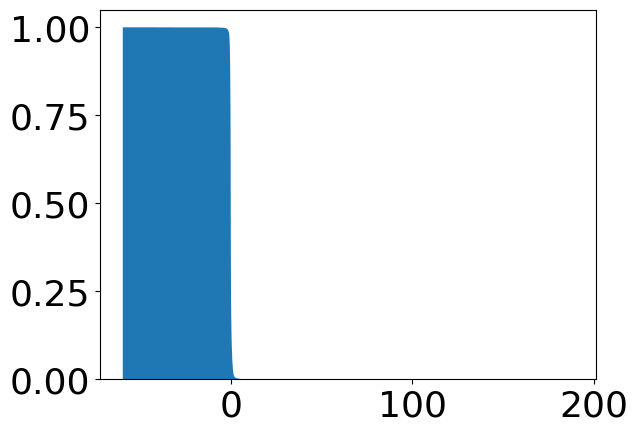

fourth moment
tensor(172323.6046, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.1126, device='cuda:0', grad_fn=<MeanBackward0>), tensor(7.0992, device='cuda:0', grad_fn=<MeanBackward0>), tensor(48.7414, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3419.2857, device='cuda:0', grad_fn=<SubBackward0>))


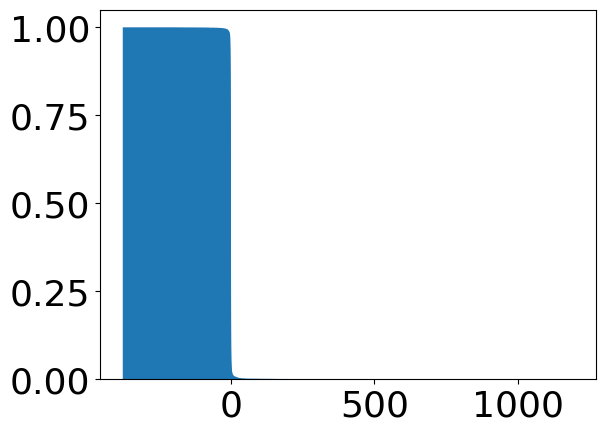

fourth moment
tensor(2.8709e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5238, device='cuda:0', grad_fn=<MeanBackward0>), tensor(356.8140, device='cuda:0', grad_fn=<MeanBackward0>), tensor(38.9011, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2250.5489, device='cuda:0', grad_fn=<SubBackward0>))


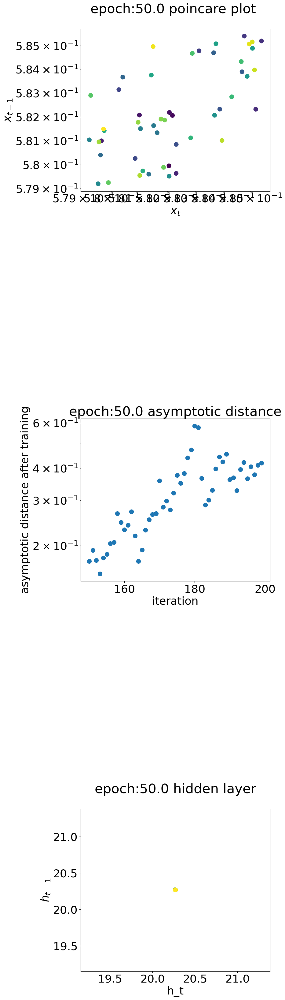

epoch : 51/1000, training loss = 0.351941,validation loss = 0.349488
epoch : 52/1000, training loss = 0.348588,validation loss = 0.347497
epoch : 53/1000, training loss = 0.346502,validation loss = 0.344857
epoch : 54/1000, training loss = 0.343918,validation loss = 0.342859
epoch : 55/1000, training loss = 0.342373,validation loss = 0.341406
epoch : 56/1000, training loss = 0.340238,validation loss = 0.339249
epoch : 57/1000, training loss = 0.338588,validation loss = 0.336948
epoch : 58/1000, training loss = 0.336515,validation loss = 0.335449
epoch : 59/1000, training loss = 0.334189,validation loss = 0.333506
epoch : 60/1000, training loss = 0.331529,validation loss = 0.330355
epoch : 61/1000, training loss = 0.329036,validation loss = 0.329038
epoch : 62/1000, training loss = 0.327741,validation loss = 0.327149
epoch : 63/1000, training loss = 0.326197,validation loss = 0.325529
epoch : 64/1000, training loss = 0.324815,validation loss = 0.322919
epoch : 65/1000, training loss = 0

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9884)
tensor(0.0002)
tensor(0.9917)
tensor(0.9770)
tensor(0.0002)
tensor(0.9917)
tensor(0.9657)
tensor(0.0003)
tensor(0.9917)
tensor(0.9546)
tensor(0.0003)
tensor(0.9918)
tensor(0.9435)
tensor(0.0002)
tensor(0.9917)
tensor(0.9326)
tensor(0.0002)
tensor(0.9917)
tensor(0.9218)
tensor(0.0002)
tensor(0.9917)
tensor(0.9111)
tensor(0.0003)
tensor(0.9917)
tensor(0.9006)
tensor(0.0003)
tensor(0.9918)
tensor(0.8902)
tensor(0.0002)
tensor(0.9917)
tensor(0.8799)
tensor(0.0002)
tensor(0.9917)
tensor(0.8697)
tensor(0.0002)
tensor(0.9917)
tensor(0.8597)
tensor(0.0003)
tensor(0.9917)
tensor(0.8497)
tensor(0.0003)
tensor(0.9918)
tensor(0.8399)
tensor(0.0002)
tensor(0.9917)
tensor(0.8302)
tensor(0.0002)
tensor(0.9917)
tensor(0.8206)
tensor(0.0002)
tensor(0.9917)
tensor(0.8111)
tensor(0.0003)
tensor(0.9917)
tensor(0.8017)
tensor(0.0003)
tensor(0.9918)
tensor(0.7924)
tensor(0.0002)
tensor(0.9917)
tensor(0.7833)
tensor(0.0002)
tensor(0.9917)
tensor(0.7742)
tensor(0.0002)
tensor(0.9917)
tensor(0.7

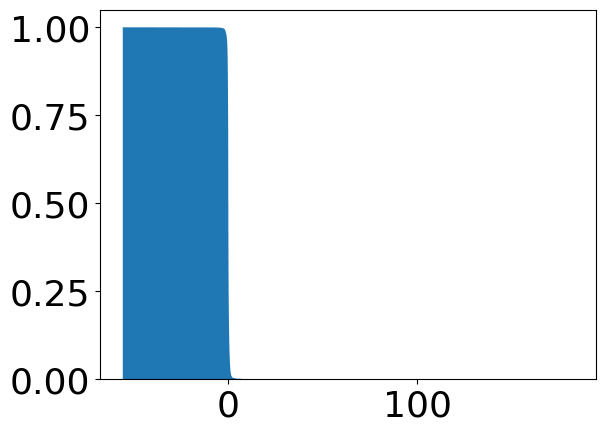

fourth moment
tensor(150238.2644, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.1053, device='cuda:0', grad_fn=<MeanBackward0>), tensor(6.5736, device='cuda:0', grad_fn=<MeanBackward0>), tensor(49.6796, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3476.4450, device='cuda:0', grad_fn=<SubBackward0>))


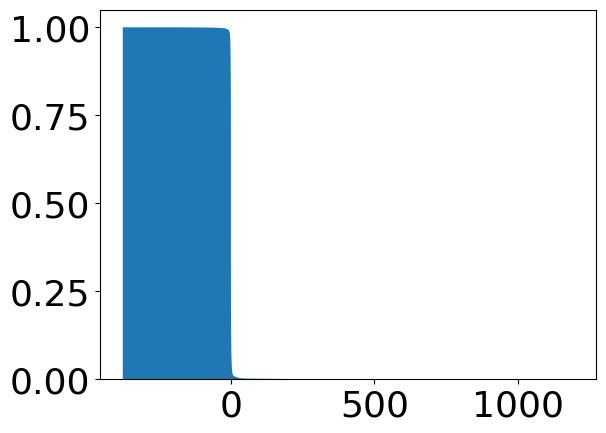

fourth moment
tensor(2.8686e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5250, device='cuda:0', grad_fn=<MeanBackward0>), tensor(354.6185, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.2169, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2276.7148, device='cuda:0', grad_fn=<SubBackward0>))


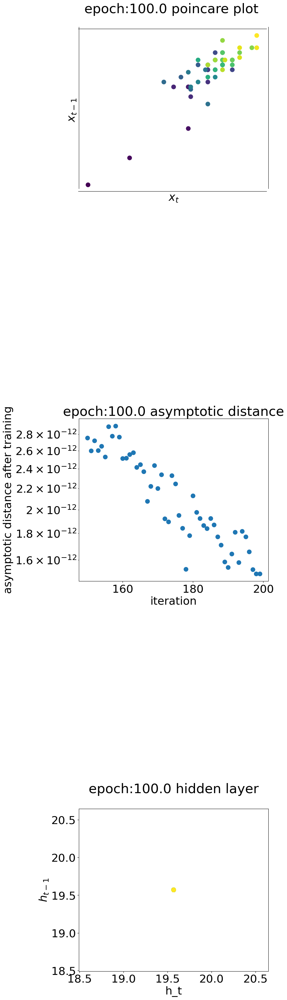

epoch : 101/1000, training loss = 0.277676,validation loss = 0.277064
epoch : 102/1000, training loss = 0.277005,validation loss = 0.275521
epoch : 103/1000, training loss = 0.275451,validation loss = 0.275209
epoch : 104/1000, training loss = 0.275116,validation loss = 0.274556
epoch : 105/1000, training loss = 0.274641,validation loss = 0.273678
epoch : 106/1000, training loss = 0.273789,validation loss = 0.273442
epoch : 107/1000, training loss = 0.272859,validation loss = 0.273176
epoch : 108/1000, training loss = 0.271849,validation loss = 0.270838
epoch : 109/1000, training loss = 0.270789,validation loss = 0.270105
epoch : 110/1000, training loss = 0.269465,validation loss = 0.268705
epoch : 111/1000, training loss = 0.268723,validation loss = 0.268030
epoch : 112/1000, training loss = 0.267168,validation loss = 0.265987
epoch : 113/1000, training loss = 0.265875,validation loss = 0.264988
epoch : 114/1000, training loss = 0.264052,validation loss = 0.262358
epoch : 115/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9849)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.9699)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.9552)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.9408)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.9265)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.9125)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.8987)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.8851)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.8717)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.8585)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.8455)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.8327)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.8201)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.8076)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.7954)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.7834)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.7715)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.7598)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.7483)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.7370)
tensor(6.5993e-06)
tensor(0.9881)
tensor(0.7258)
tenso

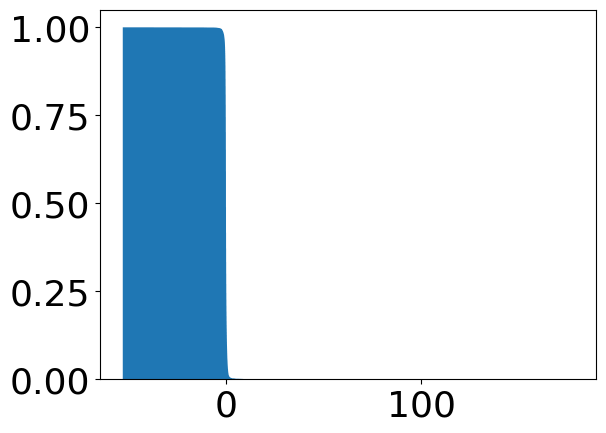

fourth moment
tensor(134633.2599, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0989, device='cuda:0', grad_fn=<MeanBackward0>), tensor(6.2104, device='cuda:0', grad_fn=<MeanBackward0>), tensor(49.9768, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3489.9107, device='cuda:0', grad_fn=<SubBackward0>))


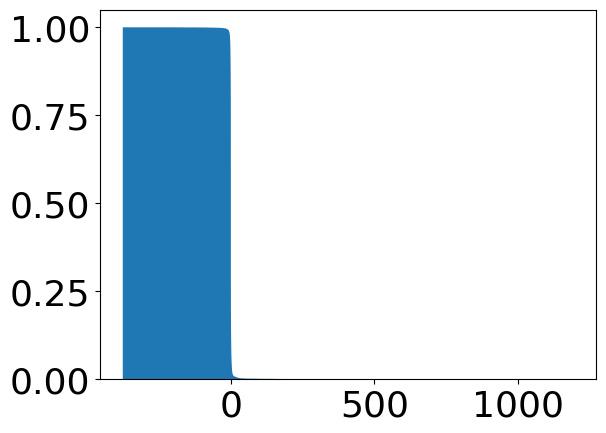

fourth moment
tensor(2.8668e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5324, device='cuda:0', grad_fn=<MeanBackward0>), tensor(353.3760, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.3909, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2291.3710, device='cuda:0', grad_fn=<SubBackward0>))


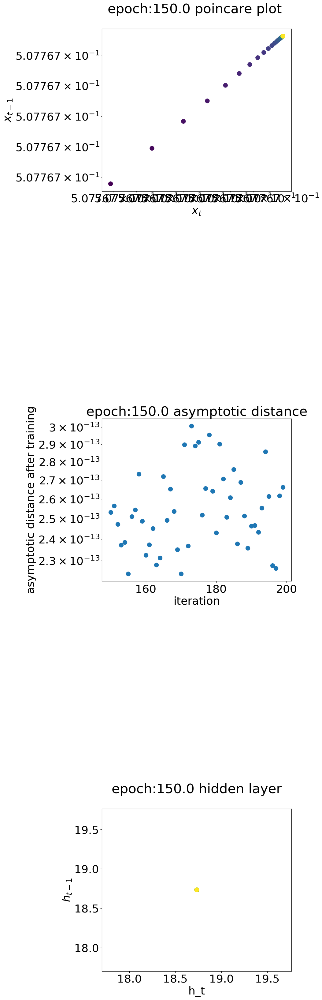

epoch : 151/1000, training loss = 0.242885,validation loss = 0.241818
epoch : 152/1000, training loss = 0.242321,validation loss = 0.241521
epoch : 153/1000, training loss = 0.241673,validation loss = 0.240821
epoch : 154/1000, training loss = 0.241143,validation loss = 0.240250
epoch : 155/1000, training loss = 0.240904,validation loss = 0.240136
epoch : 156/1000, training loss = 0.240557,validation loss = 0.240319
epoch : 157/1000, training loss = 0.240256,validation loss = 0.239173
epoch : 158/1000, training loss = 0.239368,validation loss = 0.238612
epoch : 159/1000, training loss = 0.238771,validation loss = 0.237519
epoch : 160/1000, training loss = 0.238017,validation loss = 0.236868
epoch : 161/1000, training loss = 0.236908,validation loss = 0.235519
epoch : 162/1000, training loss = 0.235951,validation loss = 0.234937
epoch : 163/1000, training loss = 0.235630,validation loss = 0.234671
epoch : 164/1000, training loss = 0.235579,validation loss = 0.235157
epoch : 165/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9850)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.9703)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.9557)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.9414)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.9273)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.9134)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.8998)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.8863)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.8730)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.8599)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.8471)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.8344)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.8219)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.8096)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.7974)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.7855)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.7737)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.7621)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.7507)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.7395)
tensor(7.8286e-06)
tensor(0.9883)
tensor(0.7284)
tenso

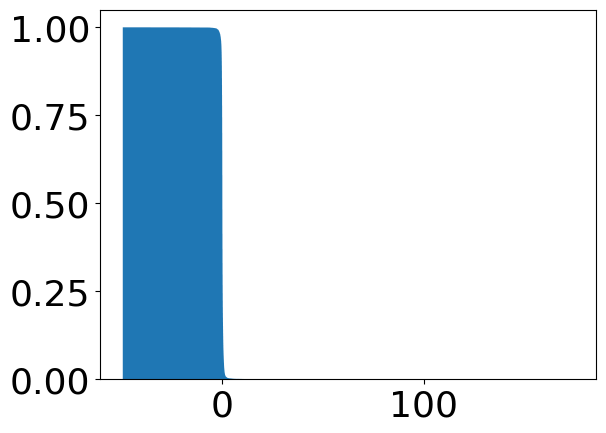

fourth moment
tensor(123932.3602, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0921, device='cuda:0', grad_fn=<MeanBackward0>), tensor(5.9584, device='cuda:0', grad_fn=<MeanBackward0>), tensor(50.0833, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3489.2984, device='cuda:0', grad_fn=<SubBackward0>))


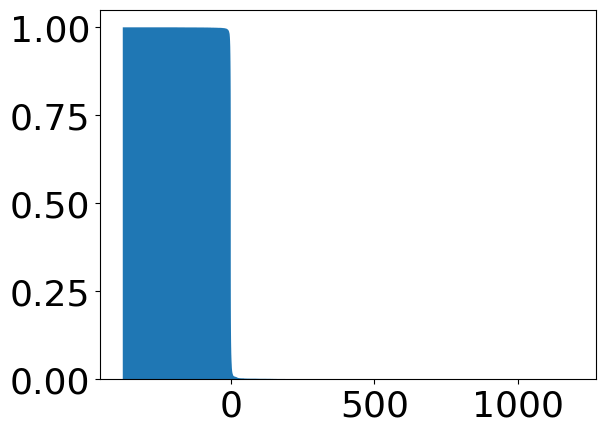

fourth moment
tensor(2.8651e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5393, device='cuda:0', grad_fn=<MeanBackward0>), tensor(352.4376, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.5194, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2302.3188, device='cuda:0', grad_fn=<SubBackward0>))


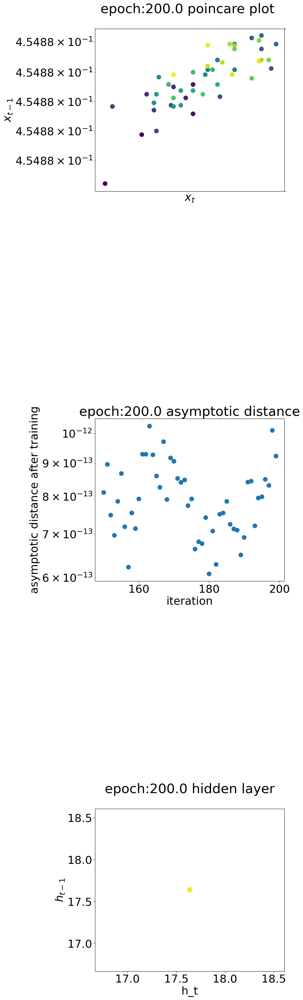

epoch : 201/1000, training loss = 0.220175,validation loss = 0.220020
epoch : 202/1000, training loss = 0.220067,validation loss = 0.219575
epoch : 203/1000, training loss = 0.219397,validation loss = 0.218340
epoch : 204/1000, training loss = 0.218897,validation loss = 0.218822
epoch : 205/1000, training loss = 0.218727,validation loss = 0.218252
epoch : 206/1000, training loss = 0.218522,validation loss = 0.219665
epoch : 207/1000, training loss = 0.218331,validation loss = 0.219148
epoch : 208/1000, training loss = 0.218052,validation loss = 0.217189
epoch : 209/1000, training loss = 0.217774,validation loss = 0.218180
epoch : 210/1000, training loss = 0.217628,validation loss = 0.217088
epoch : 211/1000, training loss = 0.217484,validation loss = 0.219429
epoch : 212/1000, training loss = 0.217243,validation loss = 0.216678
epoch : 213/1000, training loss = 0.216743,validation loss = 0.216162
epoch : 214/1000, training loss = 0.216305,validation loss = 0.215602
epoch : 215/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9824)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.9651)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.9481)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.9314)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.9150)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.8989)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.8830)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.8675)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.8522)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.8372)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.8225)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.8080)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.7938)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.7798)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.7660)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.7526)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.7393)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.7263)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.7135)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.7009)
tensor(5.3794e-07)
tensor(0.9857)
tensor(0.6886)
tenso

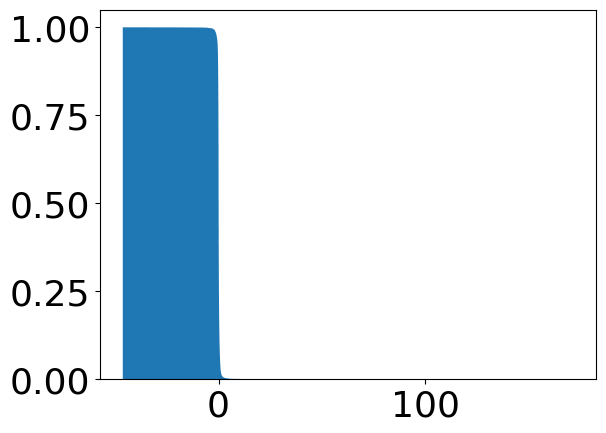

fourth moment
tensor(116172.2473, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0902, device='cuda:0', grad_fn=<MeanBackward0>), tensor(5.7564, device='cuda:0', grad_fn=<MeanBackward0>), tensor(50.3815, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3504.4137, device='cuda:0', grad_fn=<SubBackward0>))


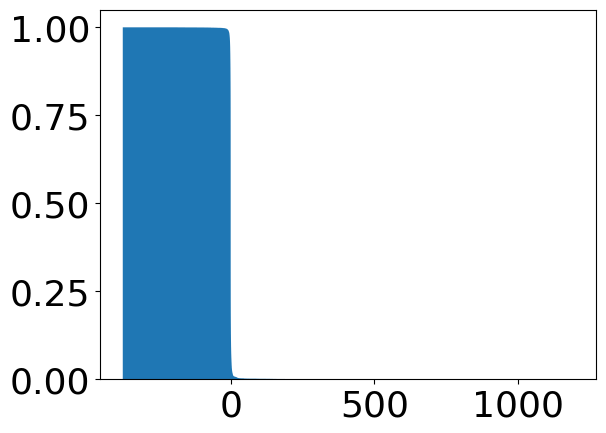

fourth moment
tensor(2.8633e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5430, device='cuda:0', grad_fn=<MeanBackward0>), tensor(351.5816, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.6317, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2312.1365, device='cuda:0', grad_fn=<SubBackward0>))


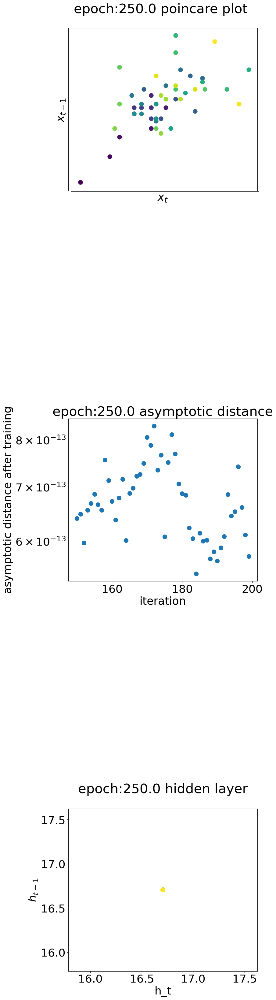

epoch : 251/1000, training loss = 0.201088,validation loss = 0.200255
epoch : 252/1000, training loss = 0.200859,validation loss = 0.200788
epoch : 253/1000, training loss = 0.200809,validation loss = 0.200469
epoch : 254/1000, training loss = 0.200445,validation loss = 0.199804
epoch : 255/1000, training loss = 0.200516,validation loss = 0.199817
epoch : 256/1000, training loss = 0.200057,validation loss = 0.199097
epoch : 257/1000, training loss = 0.199924,validation loss = 0.199145
epoch : 258/1000, training loss = 0.199301,validation loss = 0.198759
epoch : 259/1000, training loss = 0.199284,validation loss = 0.199586
epoch : 260/1000, training loss = 0.199053,validation loss = 0.198384
epoch : 261/1000, training loss = 0.198509,validation loss = 0.198005
epoch : 262/1000, training loss = 0.197988,validation loss = 0.197020
epoch : 263/1000, training loss = 0.197737,validation loss = 0.197601
epoch : 264/1000, training loss = 0.197320,validation loss = 0.196213
epoch : 265/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9871)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.9744)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.9618)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.9494)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.9371)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.9250)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.9131)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.9013)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8897)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8782)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8668)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8557)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8446)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8337)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8229)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8123)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.8018)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.7915)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.7813)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.7712)
tensor(6.3872e-05)
tensor(0.9904)
tensor(0.7612)
tenso

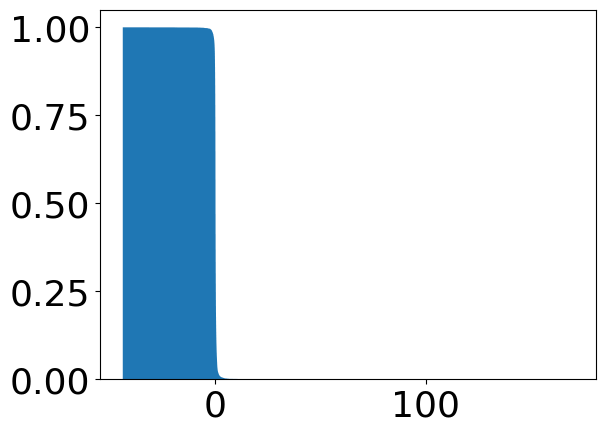

fourth moment
tensor(111702.5451, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0985, device='cuda:0', grad_fn=<MeanBackward0>), tensor(5.6500, device='cuda:0', grad_fn=<MeanBackward0>), tensor(50.3768, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3499.0119, device='cuda:0', grad_fn=<SubBackward0>))


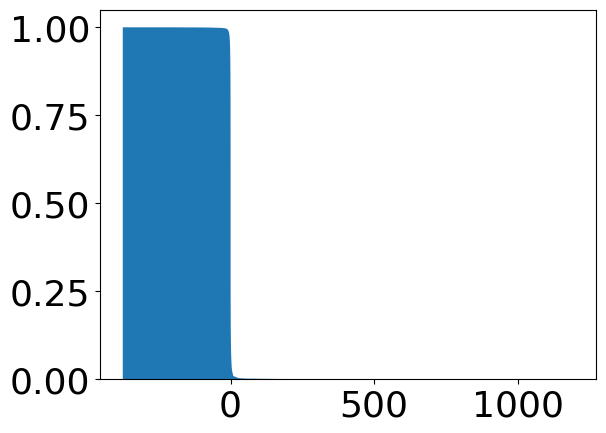

fourth moment
tensor(2.8614e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5501, device='cuda:0', grad_fn=<MeanBackward0>), tensor(350.7296, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.7441, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2321.8911, device='cuda:0', grad_fn=<SubBackward0>))


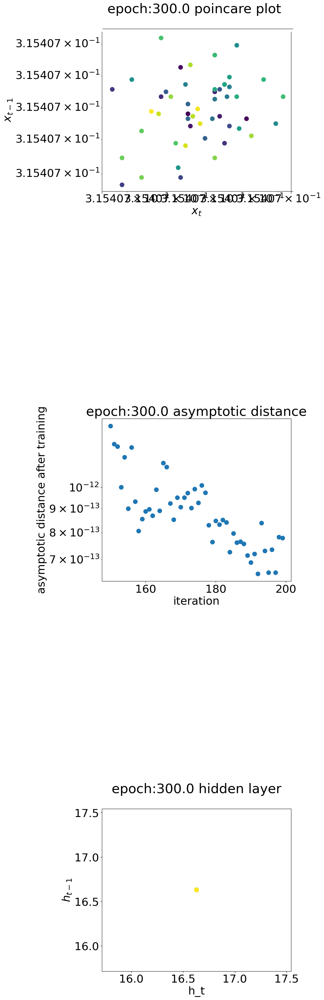

epoch : 301/1000, training loss = 0.190384,validation loss = 0.191040
epoch : 302/1000, training loss = 0.190254,validation loss = 0.189306
epoch : 303/1000, training loss = 0.190193,validation loss = 0.190626
epoch : 304/1000, training loss = 0.190019,validation loss = 0.189329
epoch : 305/1000, training loss = 0.189961,validation loss = 0.189495
epoch : 306/1000, training loss = 0.189546,validation loss = 0.189652
epoch : 307/1000, training loss = 0.188951,validation loss = 0.187730
epoch : 308/1000, training loss = 0.188804,validation loss = 0.187999
epoch : 309/1000, training loss = 0.188488,validation loss = 0.187745
epoch : 310/1000, training loss = 0.188181,validation loss = 0.187440
epoch : 311/1000, training loss = 0.187966,validation loss = 0.188781
epoch : 312/1000, training loss = 0.186966,validation loss = 0.188679
epoch : 313/1000, training loss = 0.186736,validation loss = 0.187559
epoch : 314/1000, training loss = 0.186528,validation loss = 0.185825
epoch : 315/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9845)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.9692)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.9541)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.9393)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.9247)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.9104)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.8962)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.8823)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.8686)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.8551)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.8419)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.8288)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.8159)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.8032)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.7908)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.7785)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.7664)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.7545)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.7428)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.7313)
tensor(4.4739e-06)
tensor(0.9878)
tensor(0.7199)
tenso

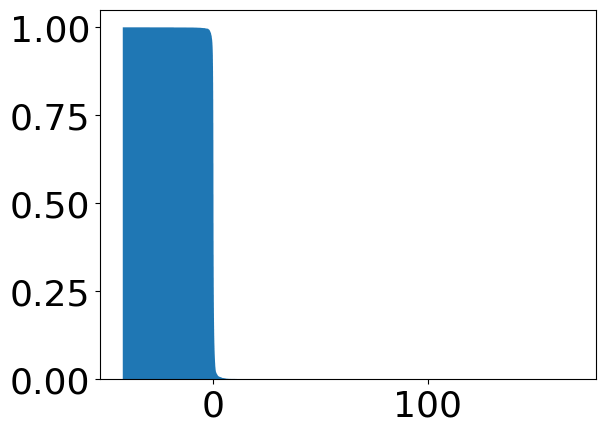

fourth moment
tensor(106541.3680, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0990, device='cuda:0', grad_fn=<MeanBackward0>), tensor(5.5278, device='cuda:0', grad_fn=<MeanBackward0>), tensor(50.2602, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3486.6599, device='cuda:0', grad_fn=<SubBackward0>))


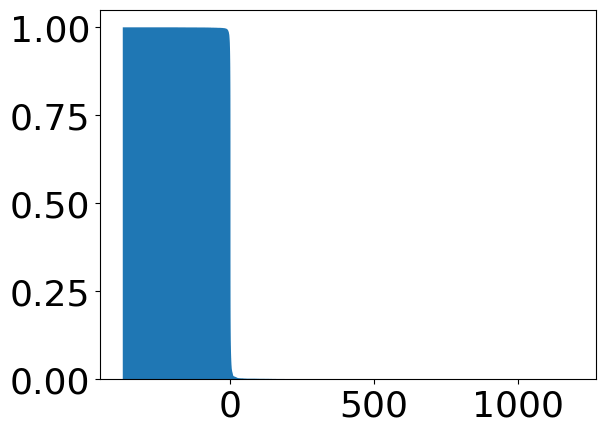

fourth moment
tensor(2.8596e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5526, device='cuda:0', grad_fn=<MeanBackward0>), tensor(350.1090, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.8160, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2328.6580, device='cuda:0', grad_fn=<SubBackward0>))


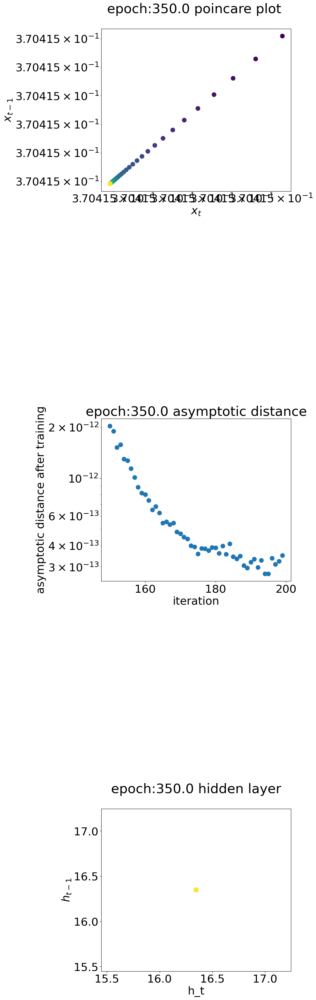

epoch : 351/1000, training loss = 0.177831,validation loss = 0.177242
epoch : 352/1000, training loss = 0.177445,validation loss = 0.177085
epoch : 353/1000, training loss = 0.177088,validation loss = 0.176209
epoch : 354/1000, training loss = 0.177096,validation loss = 0.176554
epoch : 355/1000, training loss = 0.177260,validation loss = 0.175901
epoch : 356/1000, training loss = 0.176790,validation loss = 0.177678
epoch : 357/1000, training loss = 0.176691,validation loss = 0.175975
epoch : 358/1000, training loss = 0.176018,validation loss = 0.175207
epoch : 359/1000, training loss = 0.175875,validation loss = 0.176131
epoch : 360/1000, training loss = 0.175853,validation loss = 0.176363
epoch : 361/1000, training loss = 0.175821,validation loss = 0.175344
epoch : 362/1000, training loss = 0.175557,validation loss = 0.175333
epoch : 363/1000, training loss = 0.175633,validation loss = 0.174730
epoch : 364/1000, training loss = 0.175691,validation loss = 0.175040
epoch : 365/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9862)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.9727)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.9593)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.9461)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.9331)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.9202)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.9076)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8951)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8828)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8706)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8587)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8469)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8352)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8237)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8124)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.8012)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.7902)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.7793)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.7686)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.7580)
tensor(2.6993e-05)
tensor(0.9895)
tensor(0.7476)
tenso

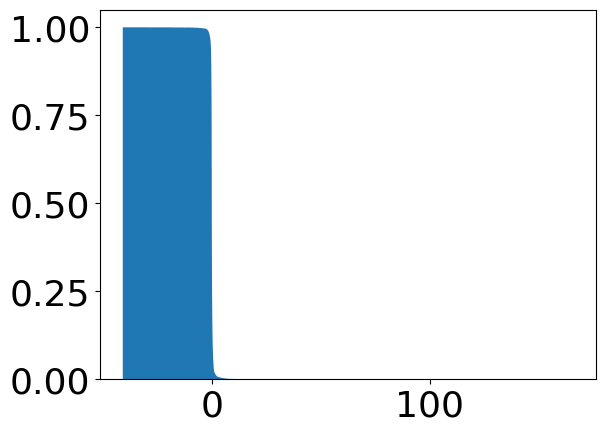

fourth moment
tensor(100330.0392, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0963, device='cuda:0', grad_fn=<MeanBackward0>), tensor(5.3760, device='cuda:0', grad_fn=<MeanBackward0>), tensor(50.0988, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3471.1881, device='cuda:0', grad_fn=<SubBackward0>))


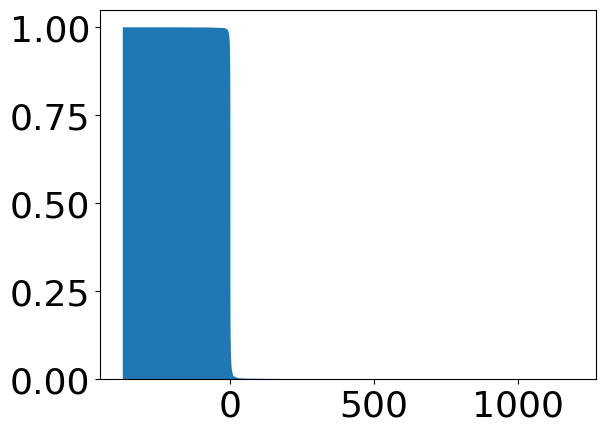

fourth moment
tensor(2.8582e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5572, device='cuda:0', grad_fn=<MeanBackward0>), tensor(349.6239, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.8761, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2334.0077, device='cuda:0', grad_fn=<SubBackward0>))


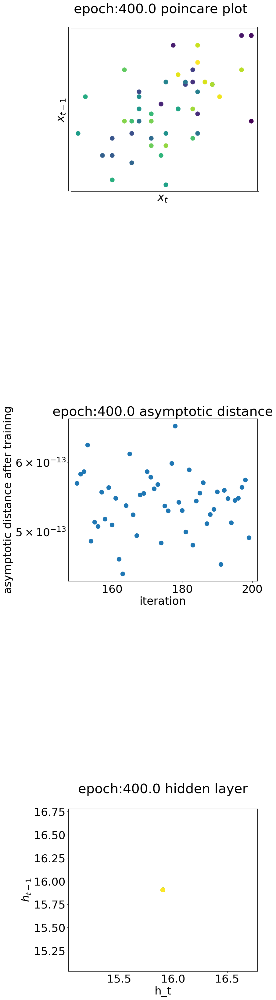

epoch : 401/1000, training loss = 0.170270,validation loss = 0.169773
epoch : 402/1000, training loss = 0.169657,validation loss = 0.168525
epoch : 403/1000, training loss = 0.169373,validation loss = 0.169096
epoch : 404/1000, training loss = 0.168680,validation loss = 0.167531
epoch : 405/1000, training loss = 0.167987,validation loss = 0.167994
epoch : 406/1000, training loss = 0.168024,validation loss = 0.167440
epoch : 407/1000, training loss = 0.167684,validation loss = 0.168295
epoch : 408/1000, training loss = 0.167626,validation loss = 0.168613
epoch : 409/1000, training loss = 0.167598,validation loss = 0.167239
epoch : 410/1000, training loss = 0.167475,validation loss = 0.166281
epoch : 411/1000, training loss = 0.167554,validation loss = 0.166819
epoch : 412/1000, training loss = 0.167436,validation loss = 0.166746
epoch : 413/1000, training loss = 0.167287,validation loss = 0.166885
epoch : 414/1000, training loss = 0.167500,validation loss = 0.166632
epoch : 415/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9860)
tensor(2.2167e-05)
tensor(0.9893)
tensor(0.9723)
tensor(2.2029e-05)
tensor(0.9893)
tensor(0.9587)
tensor(2.1899e-05)
tensor(0.9893)
tensor(0.9453)
tensor(2.1789e-05)
tensor(0.9893)
tensor(0.9321)
tensor(2.1690e-05)
tensor(0.9893)
tensor(0.9191)
tensor(2.1687e-05)
tensor(0.9893)
tensor(0.9062)
tensor(2.1759e-05)
tensor(0.9893)
tensor(0.8936)
tensor(2.1950e-05)
tensor(0.9893)
tensor(0.8811)
tensor(2.2145e-05)
tensor(0.9893)
tensor(0.8688)
tensor(2.2325e-05)
tensor(0.9893)
tensor(0.8567)
tensor(2.2506e-05)
tensor(0.9894)
tensor(0.8448)
tensor(2.2611e-05)
tensor(0.9894)
tensor(0.8330)
tensor(2.2574e-05)
tensor(0.9894)
tensor(0.8214)
tensor(2.2474e-05)
tensor(0.9894)
tensor(0.8100)
tensor(2.2437e-05)
tensor(0.9894)
tensor(0.7987)
tensor(2.2412e-05)
tensor(0.9894)
tensor(0.7875)
tensor(2.2392e-05)
tensor(0.9894)
tensor(0.7766)
tensor(2.2375e-05)
tensor(0.9893)
tensor(0.7657)
tensor(2.2362e-05)
tensor(0.9893)
tensor(0.7551)
tensor(2.2351e-05)
tensor(0.9893)
tensor(0.7445)
tenso

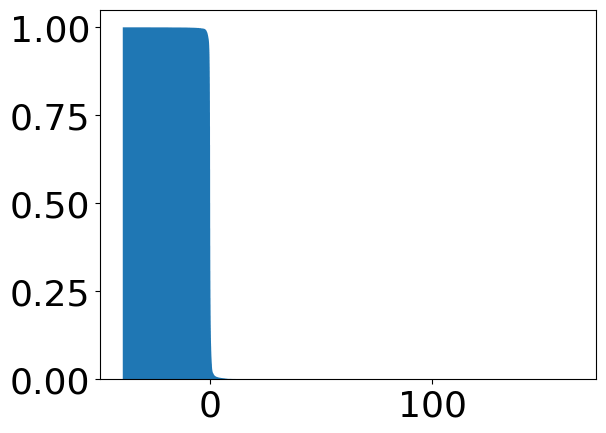

fourth moment
tensor(95019.2668, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0930, device='cuda:0', grad_fn=<MeanBackward0>), tensor(5.2357, device='cuda:0', grad_fn=<MeanBackward0>), tensor(50.0422, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3465.7560, device='cuda:0', grad_fn=<SubBackward0>))


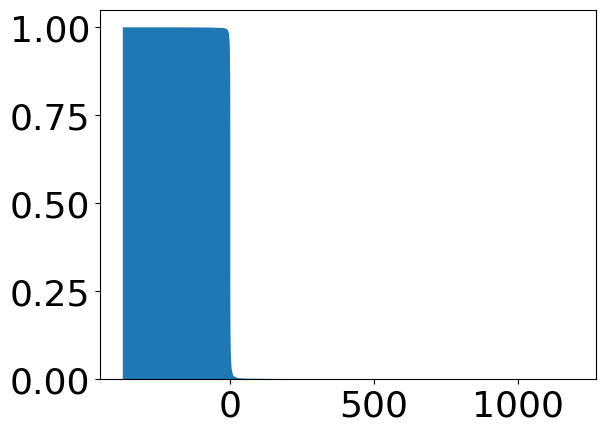

fourth moment
tensor(2.8566e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5608, device='cuda:0', grad_fn=<MeanBackward0>), tensor(349.1933, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.9237, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2338.5520, device='cuda:0', grad_fn=<SubBackward0>))


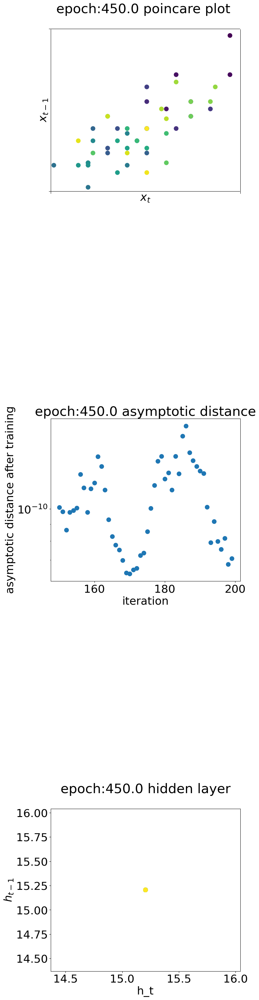

epoch : 451/1000, training loss = 0.162619,validation loss = 0.162377
epoch : 452/1000, training loss = 0.162594,validation loss = 0.161916
epoch : 453/1000, training loss = 0.162431,validation loss = 0.162268
epoch : 454/1000, training loss = 0.162186,validation loss = 0.162413
epoch : 455/1000, training loss = 0.161729,validation loss = 0.160613
epoch : 456/1000, training loss = 0.161045,validation loss = 0.160192
epoch : 457/1000, training loss = 0.160981,validation loss = 0.160612
epoch : 458/1000, training loss = 0.160945,validation loss = 0.160898
epoch : 459/1000, training loss = 0.160849,validation loss = 0.162573
epoch : 460/1000, training loss = 0.160869,validation loss = 0.159770
epoch : 461/1000, training loss = 0.160891,validation loss = 0.161573
epoch : 462/1000, training loss = 0.160915,validation loss = 0.160865
epoch : 463/1000, training loss = 0.160907,validation loss = 0.159798
epoch : 464/1000, training loss = 0.160875,validation loss = 0.159546
epoch : 465/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9886)
tensor(0.0003)
tensor(0.9919)
tensor(0.9774)
tensor(0.0003)
tensor(0.9919)
tensor(0.9662)
tensor(0.0003)
tensor(0.9919)
tensor(0.9552)
tensor(0.0003)
tensor(0.9919)
tensor(0.9443)
tensor(0.0003)
tensor(0.9919)
tensor(0.9336)
tensor(0.0003)
tensor(0.9919)
tensor(0.9230)
tensor(0.0003)
tensor(0.9919)
tensor(0.9125)
tensor(0.0003)
tensor(0.9919)
tensor(0.9021)
tensor(0.0003)
tensor(0.9919)
tensor(0.8918)
tensor(0.0003)
tensor(0.9919)
tensor(0.8816)
tensor(0.0003)
tensor(0.9919)
tensor(0.8716)
tensor(0.0003)
tensor(0.9919)
tensor(0.8617)
tensor(0.0003)
tensor(0.9919)
tensor(0.8519)
tensor(0.0003)
tensor(0.9919)
tensor(0.8422)
tensor(0.0003)
tensor(0.9919)
tensor(0.8326)
tensor(0.0003)
tensor(0.9919)
tensor(0.8231)
tensor(0.0003)
tensor(0.9919)
tensor(0.8137)
tensor(0.0003)
tensor(0.9919)
tensor(0.8044)
tensor(0.0003)
tensor(0.9919)
tensor(0.7953)
tensor(0.0003)
tensor(0.9919)
tensor(0.7862)
tensor(0.0003)
tensor(0.9919)
tensor(0.7773)
tensor(0.0003)
tensor(0.9919)
tensor(0.7

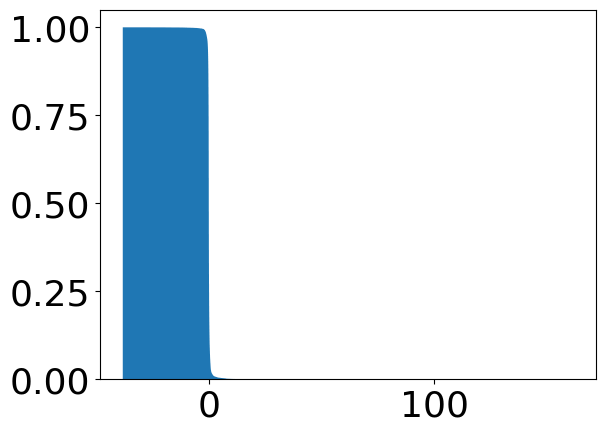

fourth moment
tensor(90686.5037, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0911, device='cuda:0', grad_fn=<MeanBackward0>), tensor(5.1326, device='cuda:0', grad_fn=<MeanBackward0>), tensor(49.7168, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3441.7549, device='cuda:0', grad_fn=<SubBackward0>))


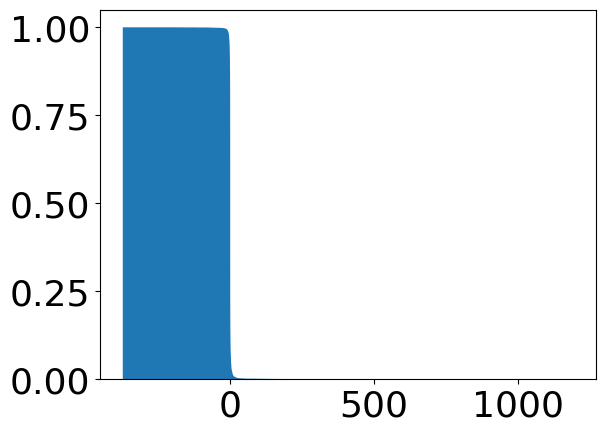

fourth moment
tensor(2.8554e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5615, device='cuda:0', grad_fn=<MeanBackward0>), tensor(348.7993, device='cuda:0', grad_fn=<MeanBackward0>), tensor(39.9725, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2342.8465, device='cuda:0', grad_fn=<SubBackward0>))


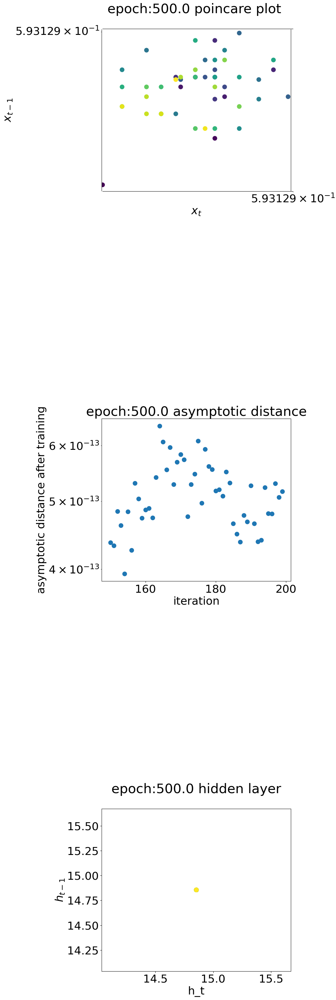

epoch : 501/1000, training loss = 0.153972,validation loss = 0.153007
epoch : 502/1000, training loss = 0.153689,validation loss = 0.154773
epoch : 503/1000, training loss = 0.153678,validation loss = 0.152947
epoch : 504/1000, training loss = 0.153743,validation loss = 0.153020
epoch : 505/1000, training loss = 0.153468,validation loss = 0.153160
epoch : 506/1000, training loss = 0.153446,validation loss = 0.152059
epoch : 507/1000, training loss = 0.153394,validation loss = 0.153644
epoch : 508/1000, training loss = 0.153510,validation loss = 0.152486
epoch : 509/1000, training loss = 0.153523,validation loss = 0.153267
epoch : 510/1000, training loss = 0.153269,validation loss = 0.153009
epoch : 511/1000, training loss = 0.153239,validation loss = 0.151994
epoch : 512/1000, training loss = 0.152963,validation loss = 0.152273
epoch : 513/1000, training loss = 0.152932,validation loss = 0.151925
epoch : 514/1000, training loss = 0.152916,validation loss = 0.153488
epoch : 515/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9849)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.9701)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.9555)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.9411)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.9269)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.9130)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.8992)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.8857)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.8724)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.8592)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.8463)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.8335)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.8210)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.8086)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.7965)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.7845)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.7727)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.7610)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.7496)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.7383)
tensor(7.2097e-06)
tensor(0.9882)
tensor(0.7272)
tenso

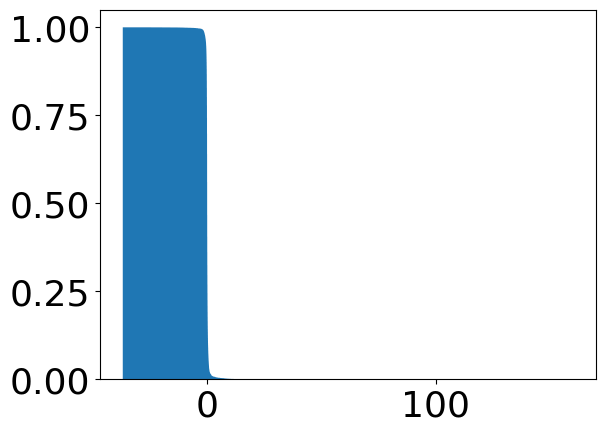

fourth moment
tensor(86758.6283, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0921, device='cuda:0', grad_fn=<MeanBackward0>), tensor(5.0342, device='cuda:0', grad_fn=<MeanBackward0>), tensor(49.5115, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3422.9504, device='cuda:0', grad_fn=<SubBackward0>))


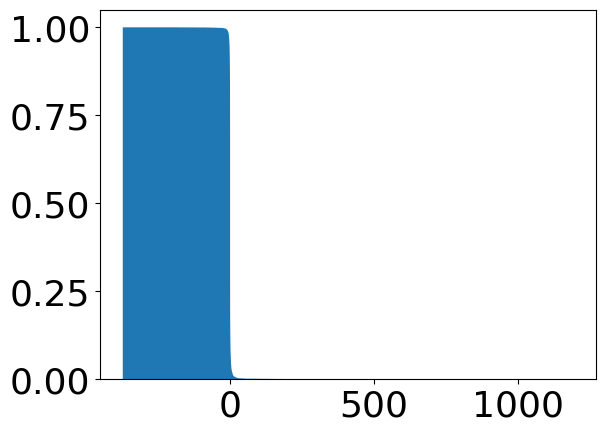

fourth moment
tensor(2.8537e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5627, device='cuda:0', grad_fn=<MeanBackward0>), tensor(348.3650, device='cuda:0', grad_fn=<MeanBackward0>), tensor(40.0188, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2347.3478, device='cuda:0', grad_fn=<SubBackward0>))


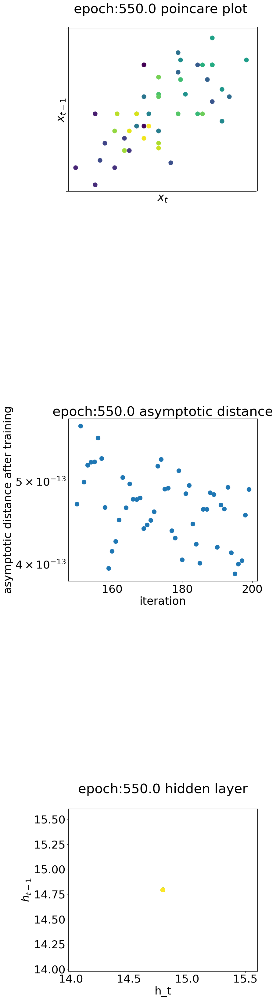

epoch : 551/1000, training loss = 0.148712,validation loss = 0.148246
epoch : 552/1000, training loss = 0.148877,validation loss = 0.147961
epoch : 553/1000, training loss = 0.148617,validation loss = 0.147531
epoch : 554/1000, training loss = 0.148484,validation loss = 0.147852
epoch : 555/1000, training loss = 0.148731,validation loss = 0.148063
epoch : 556/1000, training loss = 0.148548,validation loss = 0.148999
epoch : 557/1000, training loss = 0.148546,validation loss = 0.148004
epoch : 558/1000, training loss = 0.148488,validation loss = 0.149674
epoch : 559/1000, training loss = 0.148610,validation loss = 0.147509
epoch : 560/1000, training loss = 0.148466,validation loss = 0.147994
epoch : 561/1000, training loss = 0.148431,validation loss = 0.148799
epoch : 562/1000, training loss = 0.148247,validation loss = 0.149224
epoch : 563/1000, training loss = 0.148135,validation loss = 0.147711
epoch : 564/1000, training loss = 0.148295,validation loss = 0.148333
epoch : 565/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9845)
tensor(4.5342e-06)
tensor(0.9878)
tensor(0.9692)
tensor(4.5345e-06)
tensor(0.9878)
tensor(0.9542)
tensor(4.5341e-06)
tensor(0.9878)
tensor(0.9394)
tensor(4.5338e-06)
tensor(0.9878)
tensor(0.9248)
tensor(4.5342e-06)
tensor(0.9878)
tensor(0.9104)
tensor(4.5346e-06)
tensor(0.9878)
tensor(0.8963)
tensor(4.5342e-06)
tensor(0.9878)
tensor(0.8824)
tensor(4.5341e-06)
tensor(0.9878)
tensor(0.8687)
tensor(4.5341e-06)
tensor(0.9878)
tensor(0.8553)
tensor(4.5343e-06)
tensor(0.9878)
tensor(0.8420)
tensor(4.5341e-06)
tensor(0.9878)
tensor(0.8289)
tensor(4.5339e-06)
tensor(0.9878)
tensor(0.8161)
tensor(4.5341e-06)
tensor(0.9878)
tensor(0.8034)
tensor(4.5345e-06)
tensor(0.9878)
tensor(0.7909)
tensor(4.5341e-06)
tensor(0.9878)
tensor(0.7787)
tensor(4.5338e-06)
tensor(0.9878)
tensor(0.7666)
tensor(4.5342e-06)
tensor(0.9878)
tensor(0.7547)
tensor(4.5346e-06)
tensor(0.9878)
tensor(0.7430)
tensor(4.5343e-06)
tensor(0.9878)
tensor(0.7315)
tensor(4.5343e-06)
tensor(0.9878)
tensor(0.7201)
tenso

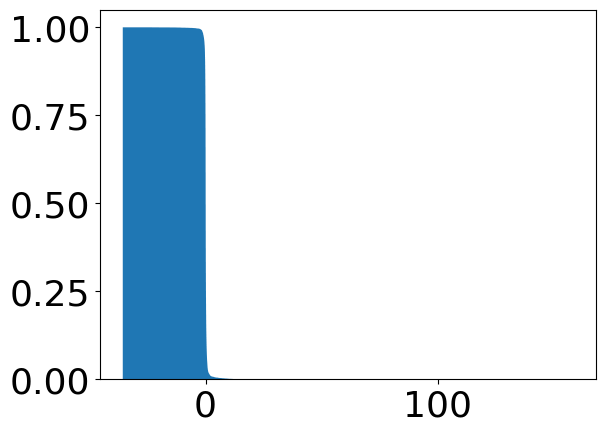

fourth moment
tensor(82911.5515, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0890, device='cuda:0', grad_fn=<MeanBackward0>), tensor(4.9251, device='cuda:0', grad_fn=<MeanBackward0>), tensor(49.3852, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3417.3529, device='cuda:0', grad_fn=<SubBackward0>))


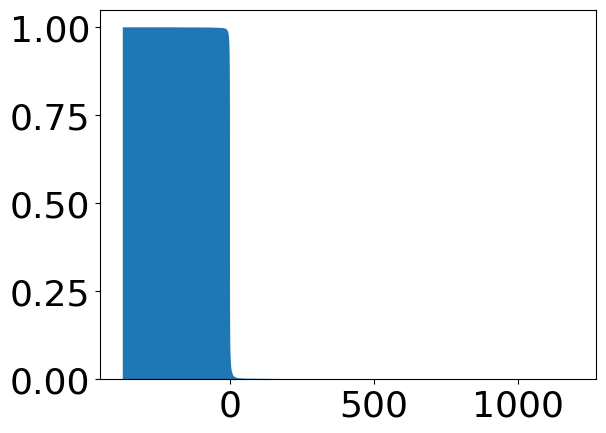

fourth moment
tensor(2.8523e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5626, device='cuda:0', grad_fn=<MeanBackward0>), tensor(347.9509, device='cuda:0', grad_fn=<MeanBackward0>), tensor(40.0668, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2351.7377, device='cuda:0', grad_fn=<SubBackward0>))


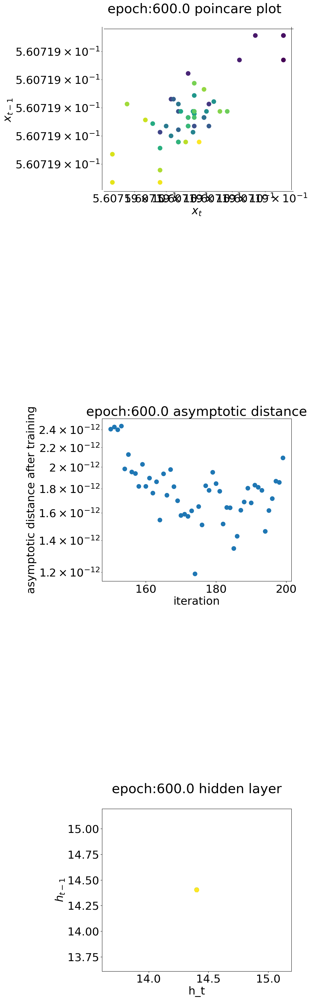

epoch : 601/1000, training loss = 0.146572,validation loss = 0.146461
epoch : 602/1000, training loss = 0.146719,validation loss = 0.146039
epoch : 603/1000, training loss = 0.146613,validation loss = 0.146203
epoch : 604/1000, training loss = 0.146671,validation loss = 0.145760
epoch : 605/1000, training loss = 0.146631,validation loss = 0.145970
epoch : 606/1000, training loss = 0.146506,validation loss = 0.146048
epoch : 607/1000, training loss = 0.146667,validation loss = 0.146251
epoch : 608/1000, training loss = 0.145369,validation loss = 0.143550
epoch : 609/1000, training loss = 0.144273,validation loss = 0.144450
epoch : 610/1000, training loss = 0.144343,validation loss = 0.144075
epoch : 611/1000, training loss = 0.144098,validation loss = 0.143322
epoch : 612/1000, training loss = 0.144226,validation loss = 0.143053
epoch : 613/1000, training loss = 0.144267,validation loss = 0.143571
epoch : 614/1000, training loss = 0.144125,validation loss = 0.143479
epoch : 615/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9840)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.9682)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.9527)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.9375)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.9225)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.9077)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.8932)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.8789)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.8648)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.8510)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.8373)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.8239)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.8108)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.7978)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.7850)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.7724)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.7601)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.7479)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.7359)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.7242)
tensor(2.7456e-06)
tensor(0.9873)
tensor(0.7126)
tenso

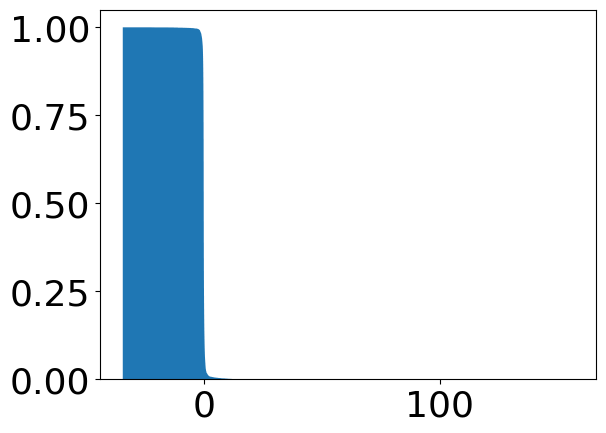

fourth moment
tensor(79446.8322, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.0864, device='cuda:0', grad_fn=<MeanBackward0>), tensor(4.8247, device='cuda:0', grad_fn=<MeanBackward0>), tensor(49.2691, device='cuda:0', grad_fn=<MeanBackward0>), tensor(3411.9221, device='cuda:0', grad_fn=<SubBackward0>))


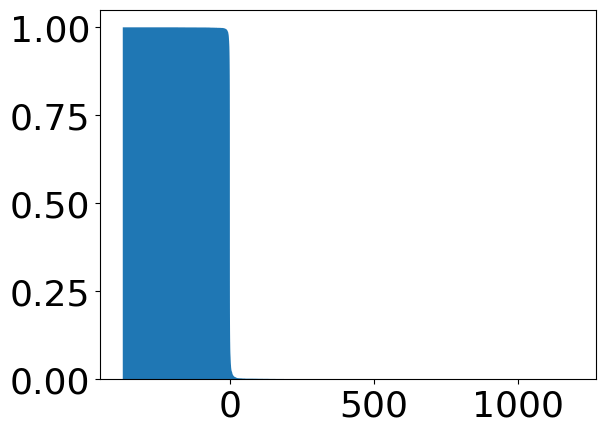

fourth moment
tensor(2.8506e+08, device='cuda:0', grad_fn=<MeanBackward0>)
(tensor(0.5646, device='cuda:0', grad_fn=<MeanBackward0>), tensor(347.5618, device='cuda:0', grad_fn=<MeanBackward0>), tensor(40.1048, device='cuda:0', grad_fn=<MeanBackward0>), tensor(2355.6450, device='cuda:0', grad_fn=<SubBackward0>))


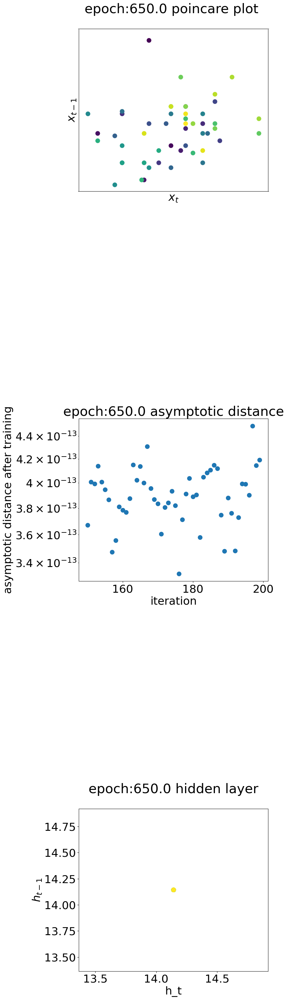

epoch : 651/1000, training loss = 0.142013,validation loss = 0.141147
epoch : 652/1000, training loss = 0.141801,validation loss = 0.141710
epoch : 653/1000, training loss = 0.142008,validation loss = 0.141105
epoch : 654/1000, training loss = 0.141702,validation loss = 0.141923
epoch : 655/1000, training loss = 0.141659,validation loss = 0.141656
epoch : 656/1000, training loss = 0.141474,validation loss = 0.141920
epoch : 657/1000, training loss = 0.141039,validation loss = 0.140376
epoch : 658/1000, training loss = 0.140977,validation loss = 0.141123
epoch : 659/1000, training loss = 0.141115,validation loss = 0.139989
epoch : 660/1000, training loss = 0.140655,validation loss = 0.139573
epoch : 661/1000, training loss = 0.140934,validation loss = 0.139734
epoch : 662/1000, training loss = 0.140424,validation loss = 0.140709
epoch : 663/1000, training loss = 0.140512,validation loss = 0.140382
epoch : 664/1000, training loss = 0.140378,validation loss = 0.141203
epoch : 665/1000, tr

/usr/local/lib/python3.10/dist-packages/torch/_tensor.py:776: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor(0.9858)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.9719)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.9581)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.9445)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.9311)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.9179)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.9049)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.8921)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.8794)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.8670)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.8547)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.8426)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.8306)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.8189)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.8073)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.7958)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.7845)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.7734)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.7625)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.7517)
tensor(1.7705e-05)
tensor(0.9891)
tensor(0.7410)
tenso

In [ ]:

spectral_radiuses=[]
average_jacobian=[]
xinfinity=[]
xpinfinity=[]
training_loss=[]
validation_loss=[]
asymptotic_dist=[]
#diverge=[]
start=time.time()
print("running")
#strength=0.1
init_compute=True
chao=[]
noise_print=False
for epoch in range(epochs):
    loss = 0


    for batch_features, _ in train_loader:
        # reshape mini-batch data to [1000, 784] matrix
        # load it to the active device
        input_image =add_gaussian_noise(batch_features,noise_strength).view(batch_size, -1).to(device)
        
        
        batch_feature=batch_features.view(batch_size,-1)
        #input_image =add_powerlaw_noise(input_size,batch_size,noise_strength,batch_feature).view(batch_size, -1).to(device)8
        # reset the gradients back to zero
        # PyTorch accumulates gradients on subsequent backward passes
 
        optimizer.zero_grad()
        
        # compute reconstructions
        #outputs = model(batch_features.view(batch_size,-1).to(device))
        outputs = model(input_image)
        
        # compute training reconstruction loss
        
 
        train_loss = criterion(outputs,batch_feature.to(device))
        
        if init_compute==True and epoch%interval==0:
            torch.save(model.state_dict(), "epoch:"+str(epoch)+".pt")
                #print("here")Trues 
                #print(train_loss)
            save_image=input_image
                #perturbed_inputs=add_gaussian_noise(x_train,perturbation_strength)
            perturbed_inputs=add_gaussian_noise(input_image,perturbation_strength)
                #print("perturbed_inputs")
                #print(torch.norm(perturbed_inputs))
            cutoff=[]
            for j in range(no_of_images):
                cutoff.append(torch.norm(perturbed_inputs[j]-input_image[j]))
            model_clone=AE(input_size,input_size,hidden_state_size,no_of_layer).to(device)
            model_clone.load_state_dict(copy.deepcopy(model.state_dict()))
            #model_clone.eval() 
            #print(cutoff)
            x_train_perturbed,y_pred_perturbed,average_jacobian,spectral_radiuses,model_clone=calculation(model,no_of_images,no_of_repetition,average_jacobian,spectral_radiuses,perturbed_inputs,epoch)
            x_train_unperturbed,y_pred_unperturbed,average_jacobian,spectral_radiuses,model_clone=calculation(model,no_of_images,no_of_repetition,average_jacobian,spectral_radiuses,input_image,epoch)
            #print("there")
            ##print(torch.norm(y_pred_perturbed))
            #print(torch.norm(y_pred_unperturbed))
            distance,hidden,chaos,ave_jac=asymptotic_iteration(model_clone,y_pred_unperturbed,y_pred_perturbed,no_of_repetition,no_of_images,cutoff)
                
            asymptotic_dist.append(distance[-1])
            chao.append(chaos)
            print(ave_jac)
            plt.scatter(x=np.arange(asymptotic_repetition,asymptotic_repetition+no_of_repetition),y=distance,s=100)
            plt.xlabel("iteration")
            plt.ylabel("asymptotic distance")
            plt.yscale("log")
            plt.title("epoch:{:.1f} asymptotic distance before training".format(epoch))
            np.savetxt("asymptotic distance"+str(epoch)+".txt",distance)
            plt.savefig("initial asymptotic state.jpg")
            plt.show()
            #average_jacobian=[]
            #spectral_radiuses=[]
            init_compute=False
        # compute accumulated gradients
        train_loss.backward()

        optimizer.step()
        
        # add the mini-batch training loss to epoch loss
        loss += train_loss.item()
        torch.save(model.state_dict(), "epoch:"+str(epoch+1)+".pt")
        
    # compute the epoch training loss
    loss = loss / len(train_loader)
    training_loss.append(loss)

    
    with torch.no_grad():
        accuracy=validation(test_loader)
        validation_loss.append(accuracy)
        
        
    print("epoch : {}/{}, training loss = {:.6f},validation loss = {:.6f}".format(epoch+1 , epochs, loss,accuracy))
    if (epoch)%interval==interval-1:
        #dimension_vector=torch.ones(input_size).to(device)
        #xt,xtminus=poincare_plot(model_clone,x_train_unperturbed[0],dimension_vector,no_of_repetition,colour,epoch)
        #name="asymptotic image input"
#         #visualisation(input_image.view(batch_size,-1)[0].cpu().detach(),epoch,name,True)
#         #x_train,y_pred,average_jacobian,spectral_radiuses,model_clone=calculation(model,no_of_images,no_of_repetition,average_jacobian,spectral_radiuses,input_image,epoch)
        perturbed_input=add_gaussian_noise(save_image,perturbation_strength)
        cutoffs=[]
        for j in range(no_of_images):
            cutoffs.append(torch.norm(perturbed_input[j]-save_image[j]))
        #print(cutoffs)
        x_train_perturbed,y_pred_perturbed,average_jacobian,spectral_radiuses,model_clone=calculation(model,no_of_images,no_of_repetition,average_jacobian,spectral_radiuses,perturbed_input,epoch)
        x_train_unperturbed,y_pred_unperturbed,average_jacobian,spectral_radiuses,model_clone=calculation(model,no_of_images,no_of_repetition,average_jacobian,spectral_radiuses,save_image,epoch)
        distance,hidden,chaos,ave_jac=asymptotic_iteration(model_clone,y_pred_unperturbed,y_pred_perturbed,no_of_repetition,no_of_images,cutoffs)
                

        dimension_vector=torch.ones(input_size).to(device)
        xt,xtminus=poincare_plot(model_clone,x_train_perturbed[0],dimension_vector,no_of_repetition,colour,epoch)
        average_jacobian.append(ave_jac)
        print(ave_jac)
         #perturbed_inputs=add_gaussian_noise(x_train,perturbation_strength)
     
       
         #perturbed_inputs=add_powerlaw_noise(input_size,batch_size,perturbation_strength,x_train.cpu()).view(batch_size, -1).to(device)
         #distance,hidden,chaos=asymptotic_iteration(model_clone,x_train,perturbed_inputs,no_of_repetition,no_of_images,perturbation_strength)
        print("percentage of chaos:",chaos) 
        
        asymptotic_dist.append(distance[-1])
         #print(distance[-1])
        inits=0
        for value in model.parameters():
                 #print(key)
            plots=torch.flatten(value).cpu().detach().numpy()
            plt.hist(plots, density=True, bins='auto', histtype='stepfilled',cumulative=-1)
                 #plt.title("model "+str(key)+"plot")
            plt.savefig("model "+str(inits)+"plot.jpg")
            np.savetxt("fianl weight"+str(inits)+".txt",value.cpu().detach().numpy())
            plt.show()
            print(stats(value))
            inits+=1
        
        
        chao.append(chaos)
         #diverge.append(divergent/100)
        

        fig = plt.figure(figsize=(8,40))

        plt.subplot(5, 1, 1)
        plt.scatter(xt,xtminus,c=colour,s=100)
        plt.xlabel("$x_t$")
        plt.ylabel("$x_{t-1}$")
        plt.title("epoch:{:.1f} poincare plot ".format(epoch+1),y=1.08)
        plt.xscale("log")
        plt.yscale("log")
        
        plt.subplot(5, 1, 3)
        plt.scatter(np.arange(asymptotic_repetition,asymptotic_repetition+no_of_repetition),distance,s=100)
        plt.xlabel("iteration")
        plt.ylabel("asymptotic distance after training")
        np.savetxt("asymptotic distance"+str(epoch+1),distance)
        plt.yscale("log")
        plt.title("epoch:{:.1f} asymptotic distance".format(epoch+1))
        
        
        plt.subplot(5, 1, 5)
        #plt.figure().set_figheight(8)
        plt.scatter(hidden[:-1],hidden[1:],c=colour[:-1],s=100)
        plt.xlabel("h_t")
        plt.ylabel("$h_{t-1}$")
        #plt.yscale("log")
        plt.title("epoch:{:.1f} hidden layer".format(epoch+1),y=1.08)
        plt.savefig("epoch:"+str(epoch+1)+"number of iteration:"+str(no_of_repetition)+".jpg",bbox_inches = 'tight')
        plt.show()

        #torch.save(model.state_dict(), "epoch:"+str(epoch+1)+".pt")
       # name="asymptotic image output"
        #visualisation(y_pred.view(batch_size,-1)[0].cpu().detach(),epoch,name,True)
        #print(distance)
        
        #torch.save(model.state_dict(), "epoch:"+str(epoch+1)+".pt")
       # name="asymptotic image output"
        #visualisation(y_pred.view(batch_size,-1)[0].cpu().detach(),epoch,name,True)
        #print(distance)
        
end=time.time()
print(end-start)

print(chao)



In [ ]:
labels="noise:{:F} \n perturbation:{:F}".format(noise_strength,perturbation_strength)

print(chao)
font = {
        'size'   : 14}
plt.rc('font', **font)

intervals=50
x=np.arange(1,(epochs+intervals)/intervals+1)
print(len(x))
print(len(chao))
plt.scatter(x,y=chao,label=labels)
plt.ylabel("fraction of images in chaos")
plt.xlabel("epoch/"+str(interval))
#plt.set_label("noise:{:.f},perturbation:{:.f}".format(noise_strength,perturbation_strength))
plt.legend(loc="best")
plt.savefig("percentage of image in chaos.jpg")

np.savetxt("percentage of chaos.txt",chao)
plt.show()









print("asymptotic distance")

plt.scatter(x,y=asymptotic_dist,label=labels)
#labels="noise:"+str(noise_strength)+", perturbation:"+str(perturbation_strength)
plt.ylabel("asymptotic distance")
plt.xlabel("epoch/"+str(interval))
plt.yscale("log")
#plt.set_label("noise:{:.f},perturbation:{:.f}".format(noise_strength,perturbation_strength))
plt.legend(loc="best")
plt.savefig("asymptotic distance.jpg",)

plt.show()
np.savetxt("asymptotic distance.txt",asymptotic_dist)
average_jacobian=np.asarray(average_jacobian)

print("average jacobian")
print(len(average_jacobian))
plt.scatter(x[1:],y=average_jacobian,label="noise:{:F}\n perturbation:{:F}".format(noise_strength,perturbation_strength))
plt.ylabel("average jacobian")
plt.xlabel("epoch/"+str(interval))
#plt.yscale("log")
#plt.set_label("noise:{:.f},perturbation:{:.f}".format(noise_strength,perturbation_strength))
plt.legend(loc="best")
plt.savefig("average_jacobian.jpg")
np.savetxt("average jacobian.txt",average_jacobian)
plt.show()


#print("spectral radius")
#plt.scatter(x,y=spectral_radiuses,label="noise:{:F},perturbation:{:F}".format(noise_strength,perturbation_strength))
#plt.ylabel("spectral radius")
#plt.xlabel("epoch/20")
#plt.yscale("log")
#plt.set_label("noise:{:.f},perturbation:{:.f}".format(noise_strength,perturbation_strength))
#plt.legend(loc="best")
#plt.savefig("spectral radius.jpg")

np.savetxt("spectral radius.txt",spectral_radiuses)
plt.show()

print("loss function")
plt.plot(validation_loss,label="validation loss")
plt.plot(training_loss,label="training loss")
plt.ylabel("losss")
plt.xlabel("epoch")
#plt.set_label("noise:{:.f},perturbation:{:.f}".format(noise_strength,perturbation_strength))
plt.legend(loc="best")
plt.yscale("log")
plt.savefig("loss function.jpg")
plt.show()
#print("asymptotic distance")
plot_loss=[]
for i in range(len(validation_loss)):
    if i%intervals==0:
        plot_loss.append(validation_loss[i])
fig, ax1 = plt.subplots()
xx=np.arange(1,epochs/intervals+1)
color = 'tab:red'
ax1.set_xlabel('epoch/'+str(intervals))
ax1.set_ylabel('validation loss', color=color)
ax1.scatter(xx,y=plot_loss, label="validation loss",color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_yscale("log")
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('asymptotic distance', color=color)  # we already handled the x-label with ax1
ax2.scatter(x,y=asymptotic_dist, color=color,label="asymptotic distance")
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_yscale("log")
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()
plt.scatter(xx,plot_loss,label="validation loss")
        
        
        
#plt.plot(x,plot_loss,label="validation loss")
plt.scatter(x,y=asymptotic_dist,label="asymptotic distance")

#labels="noise:"+str(noise_strength)+", perturbation:"+str(perturbation_strength)
plt.ylabel("asymptotic distance")
plt.xlabel("epoch/"+str(interval))
plt.yscale("log")
#plt.set_label("noise:{:.f},perturbation:{:.f}".format(noise_strength,perturbation_strength))
plt.legend(loc="best")
plt.savefig("asymptotic distance.jpg")

plt.show()
np.savetxt("loss_function.txt",(validation_loss,training_loss))
plt.show()

plt.plot(validation_loss)
plt.yscale("log")
plt.show()
plt.plot(training_loss)
plt.yscale("log")
plt.show()